In [1]:
import os

ROOT = '/kaggle/input/datasets/minturoy2026/agri-vision/'
TEST = ROOT + "test"
TRAIN = ROOT + 'train'
VALID = ROOT + 'valid'

os.listdir(path=TRAIN)

['Papaya_Mosaic_Virus',
 'Papaya_Yellow_Necrotic_Spots_Holes',
 'Batol_Gourd_Downy_Mildew',
 'Batol_Gourd_Fungal_Damage_Leaf',
 'Papaya_Carica_Insect_Hole',
 'Tomato_Downy_Mildew',
 'Tomato_White_spot',
 'Batol_Gourd_Mosaic_Virus',
 'Papaya_Bacterial_Blight',
 'Batol_Gourd_Early_Alternaria_Leaf_Blight',
 'Papaya_Healthy_leaf',
 'Tomato_Healthy',
 'Batol_Gourd_Alternaria_Leaf_Blight',
 'Tomato_Spot',
 'Batol_Gourd_Anthracnose',
 'Papaya_Curled_Yellow_Spot',
 'Batol_Gourd_Healthy',
 'Papaya_Pathogen_symptoms',
 'Tomato_Mosaic']

We want to use ResNeXt image embeddings for EDA and classification, so let's add some code to get them for us.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth


100%|██████████| 95.8M/95.8M [00:00<00:00, 127MB/s]


Let's load up all of our data and do a little tag cleanup. This will feel like it is taking forever, but it will be done in under fifteen minutes.

In [3]:
import arrow
import base64
import pandas as pd
import tqdm

from glob import iglob
from io import BytesIO
from os.path import basename
from os.path import isdir
from PIL import Image

IGNORE = {}
THUMBNAIL_SIZE = (48, 48)

def embed(model, filename: str):
    try:
        with Image.open(fp=filename, mode='r') as image:
            return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)
    except: 
        print(filename)
        return None


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'])
        for index, input_file in enumerate(list(iglob(pathname=arg))) if basename(input_file) not in IGNORE ]
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*') if isdir(folder)}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key.replace('_', ' ')) for (key, value) in tqdm.tqdm(desc='train classes', iterable=train_dict.items())]))
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*') if isdir(folder)}
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key.replace('_', ' ')) for (key, value) in tqdm.tqdm(desc='test classes', iterable=test_dict.items())]))
val_dict = {basename(folder) : folder + '/*.*' for folder in iglob(VALID + '/*') if isdir(folder)}
val_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key.replace('_', ' ')) for (key, value) in tqdm.tqdm(desc='val classes', iterable=val_dict.items())]))
train_df = pd.concat(axis='index', objs=[train_df, val_df])
print('done in {}'.format(arrow.now() - time_start))

val classes: 100%|██████████| 19/19 [02:50<00:00,  8.99s/it]

done in 0:20:10.507172


We have 19 classes; are they even close to balanced?

In [4]:
train_df['tag'].value_counts(normalize=True).to_frame().T

tag,Papaya Curled Yellow Spot,Papaya Carica Insect Hole,Batol Gourd Mosaic Virus,Papaya Pathogen symptoms,Batol Gourd Downy Mildew,Batol Gourd Alternaria Leaf Blight,Tomato Healthy,Batol Gourd Healthy,Tomato Spot,Batol Gourd Anthracnose,Tomato Mosaic,Papaya Healthy leaf,Batol Gourd Early Alternaria Leaf Blight,Papaya Bacterial Blight,Papaya Mosaic Virus,Tomato White spot,Tomato Downy Mildew,Papaya Yellow Necrotic Spots Holes,Batol Gourd Fungal Damage Leaf
proportion,0.111352,0.083127,0.077854,0.074132,0.072891,0.067618,0.066687,0.064206,0.063896,0.058313,0.051179,0.048697,0.041563,0.037841,0.026675,0.016749,0.014578,0.013027,0.009615


They are not balanced. Let's visualize our class imbalance with a pie chart.

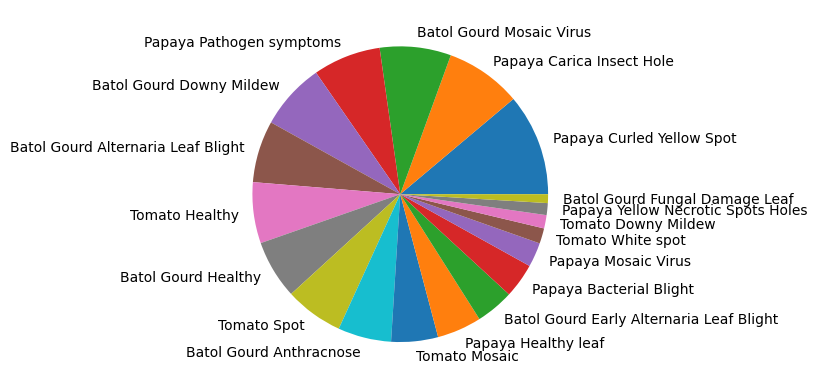

In [5]:
import matplotlib.pyplot as plt

train_df['tag'].value_counts(normalize=False).to_frame().plot.pie(y='count')
plt.ylabel('')
plt.legend().remove()
plt.show()

In [6]:
test_df['tag'].value_counts(normalize=True).to_frame().T

tag,Papaya Curled Yellow Spot,Papaya Carica Insect Hole,Batol Gourd Mosaic Virus,Batol Gourd Downy Mildew,Papaya Pathogen symptoms,Batol Gourd Alternaria Leaf Blight,Tomato Healthy,Batol Gourd Healthy,Tomato Spot,Batol Gourd Anthracnose,Tomato Mosaic,Papaya Healthy leaf,Batol Gourd Early Alternaria Leaf Blight,Papaya Bacterial Blight,Papaya Mosaic Virus,Tomato White spot,Tomato Downy Mildew,Papaya Yellow Necrotic Spots Holes,Batol Gourd Fungal Damage Leaf
proportion,0.109797,0.08277,0.077703,0.072635,0.072635,0.067568,0.065878,0.064189,0.0625,0.057432,0.050676,0.048986,0.04223,0.038851,0.027027,0.018581,0.015203,0.013514,0.011824


Our classes in our test data are similarly imbalanced; let's visualize our class imbalance with a bar chart instead this time.

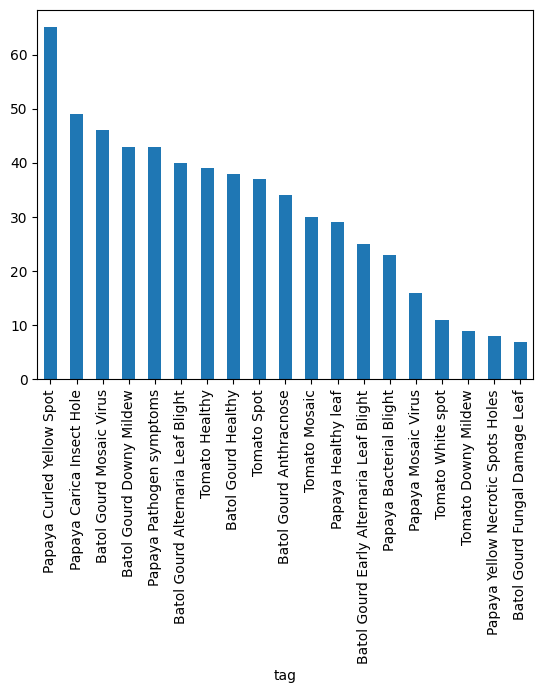

In [7]:
test_df['tag'].value_counts(normalize=False).to_frame().plot.bar(y='count')
plt.ylabel('')
plt.legend().remove()
plt.show()

Next let's use TSNE to add x/y coordinates based on our image embeddings. We'll use them to make some scatter plots.

In [8]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2026, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))
test_reducer = TSNE(random_state=2026, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
test_df[['x', 'y']] = test_reducer.fit_transform(X=test_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3224 samples in 0.021s...
[t-SNE] Computed neighbors for 3224 samples in 1.221s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3224
[t-SNE] Computed conditional probabilities for sample 2000 / 3224
[t-SNE] Computed conditional probabilities for sample 3000 / 3224
[t-SNE] Computed conditional probabilities for sample 3224 / 3224
[t-SNE] Mean sigma: 2.123006
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.341103
[t-SNE] KL divergence after 1000 iterations: 1.540881
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 592 samples in 0.003s...
[t-SNE] Computed neighbors for 592 samples in 0.071s...
[t-SNE] Computed conditional probabilities for sample 592 / 592
[t-SNE] Mean sigma: 2.721091
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.700630
[t-SNE] KL divergence after 1000 iterations: 0.950631


Let's plot.

In [9]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=min(len(train_df) - 1, 10000)))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: agri-vision', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

This is kind of a mess; our ResNeXt embeddings, once we cluster them with TSNE, cluster first according to something else, and secondarily in a way that sort of aligns with our classes. Let's make a static plot and see if that tells us anything.

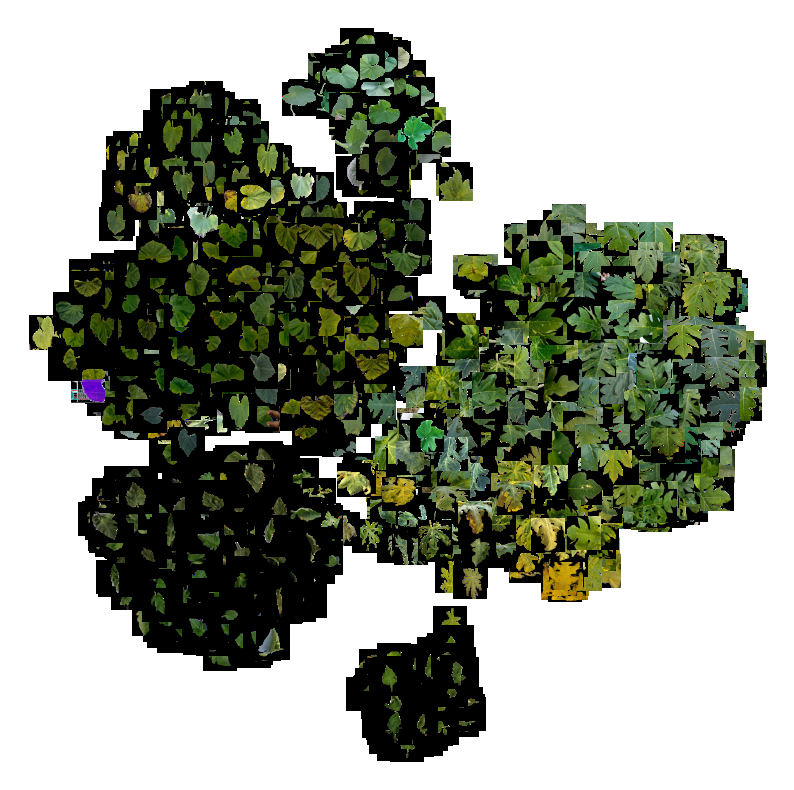

In [10]:
import base64
import io
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from PIL import Image

# we recycled some PNG encoding code above, and we need to postprocess it for using with matplotlib
train_df['PNG'] = train_df['png'].str.replace('^data:image/png;base64,', '', regex=True)

fig, ax = plt.subplots(figsize=(10, 10))

for index, row in train_df.iterrows():
    img_bytes = base64.b64decode(row["PNG"])
    img = Image.open(io.BytesIO(img_bytes))
    imagebox = OffsetImage(img, zoom=0.5)
    ab = AnnotationBbox(imagebox, (row["x"], row["y"]), frameon=False, pad=0)
    ax.add_artist(ab)
ax.scatter(train_df["x"], train_df["y"], alpha=0)
ax.axis('off')
plt.show()

What do we see? We see that our data clusters first according to how much black/background there is in the image, and then secondarily by leaf features. There seems to be a confounding variable in how the data was collected.

Ah. On further review, the big clusters are the species of plants: tomato, gourd, etc. And the smaller clusters are the different classes within the plant species.

Let's make a model and see what we get.

In [11]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

logreg = LogisticRegression(max_iter=10000, tol=1e-12, verbose=0, ).fit(train_df['value'].apply(func=pd.Series), train_df['tag'],)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print(classification_report(zero_division=0.0, y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series))))

model fit in 3345 iterations
accuracy: 0.6571
f1: 0.6520
                                          precision    recall  f1-score   support

      Batol Gourd Alternaria Leaf Blight       0.64      0.68      0.66        40
                 Batol Gourd Anthracnose       0.75      0.53      0.62        34
                Batol Gourd Downy Mildew       0.70      0.72      0.71        43
Batol Gourd Early Alternaria Leaf Blight       0.41      0.44      0.42        25
          Batol Gourd Fungal Damage Leaf       0.50      0.29      0.36         7
                     Batol Gourd Healthy       0.85      0.87      0.86        38
                Batol Gourd Mosaic Virus       0.71      0.78      0.74        46
                 Papaya Bacterial Blight       0.48      0.52      0.50        23
               Papaya Carica Insect Hole       0.61      0.47      0.53        49
               Papaya Curled Yellow Spot       0.74      0.78      0.76        65
                     Papaya Healthy leaf

Our model is not highly accurate, but this is a tough problem: we have class imbalances, not a lot of data, and noisy data. So maybe an f1 score of 0.65 isn't bad all things considered. Let's look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

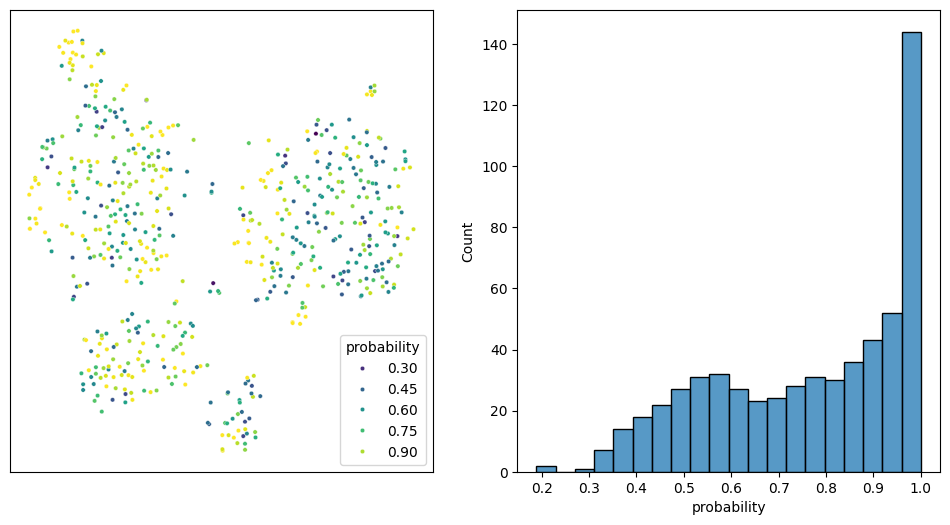

In [12]:
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = test_df[['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=test_df['value'].apply(func=pd.Series)), axis=1)

fig, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis', s=10)
ax[0].set(xlabel=None)
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

Our model probabilities are rough almost all over. Wow.